In [ ]:
!nvidia-smi

Sat Mar 16 06:45:09 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# installing package to work with yolov8
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.3/721.3 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 55.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 66.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 73.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

In [ ]:
from IPython import display
display.clear_output()

In [ ]:
import os
import cv2
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [ ]:
def load_dataset(root_dir):
    train_dir = os.path.join(root_dir, 'train')
    valid_dir = os.path.join(root_dir, 'valid')

    # Load training data
    train_images, train_annotations = load_data(train_dir)

    # Load validation data
    valid_images, valid_annotations = load_data(valid_dir)

    return train_images, train_annotations, valid_images, valid_annotations

In [ ]:
def load_data(data_dir):
    image_paths = []
    annotation_paths = []

    # Collect image and annotation file paths
    for filename in os.listdir(data_dir):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            image_paths.append(os.path.join(data_dir, filename))
            annotation_paths.append(os.path.join(data_dir, filename.replace('.jpg', '.txt').replace('.png', '.txt')))

    # Load images
    images = [cv2.imread(img_path) for img_path in image_paths]

    # Load annotations
    annotations = [load_annotations(ann_path) for ann_path in annotation_paths]

    return images, annotations

In [ ]:
def load_annotations(annotation_path):
    with open(annotation_path, 'r') as file:
        lines = file.readlines()
        # Assuming YOLO format: class, x_center, y_center, width, height
        annotations = [list(map(float, line.strip().split())) for line in lines]

    return np.array(annotations)


root_directory = 'C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Dataset/dataset'
train_images, train_annotations, valid_images, valid_annotations = load_dataset(root_directory)

In [ ]:
train_directory = 'C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Dataset/dataset/train'
files_in_directory = os.listdir(train_directory)
print(files_in_directory)

['labels', 'images']


In [ ]:
valid_directory = 'C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Dataset/dataset/valid'
files_in_directory = os.listdir(valid_directory)
print(files_in_directory)

['labels', 'images']


In [ ]:
def load_sample_data(data_dir):
    image_dir = os.path.join(data_dir, 'images')
    label_dir = os.path.join(data_dir, 'labels')

    image_paths, label_paths = [], []

    # Collect image and label file paths
    for filename in os.listdir(image_dir):
        if filename.endswith('.jpg'):
            image_paths.append(os.path.join(image_dir, filename))
            label_paths.append(os.path.join(label_dir, filename.replace('.jpg', '.txt')))

    return image_paths, label_paths

In [ ]:
def load_annotations(annotation_path):
    with open(annotation_path, 'r') as file:
        lines = file.readlines()
        # Assuming YOLO format: class, x_center, y_center, width, height
        annotations = [list(map(float, line.strip().split())) for line in lines]

    return annotations

image_paths, annotation_paths = load_sample_data(train_directory)

In [ ]:
def count_files(directory):
    image_dir = os.path.join(directory, 'images')
    label_dir = os.path.join(directory, 'labels')

    image_count = len([f for f in os.listdir(image_dir) if f.endswith('.jpg')])
    label_count = len([f for f in os.listdir(label_dir) if f.endswith('.txt')])

    return image_count, label_count

image_count, label_count = count_files(train_directory)

print(f"Number of images in the training set: {image_count}")
print(f"Number of labels in the training set: {label_count}")

Number of images in the training set: 20700
Number of labels in the training set: 20700


In [ ]:
def count_files(directory):
    image_dir = os.path.join(directory, 'images')
    label_dir = os.path.join(directory, 'labels')

    image_count = len([f for f in os.listdir(image_dir) if f.endswith('.jpg')])
    label_count = len([f for f in os.listdir(label_dir) if f.endswith('.txt')])

    return image_count, label_count

image_count, label_count = count_files(valid_directory)

print(f"Number of images in the training set: {image_count}")
print(f"Number of labels in the training set: {label_count}")

Number of images in the training set: 1979
Number of labels in the training set: 1979


In [ ]:
# Print labels for the first 10 samples
for i in range(min(10, len(annotation_paths))):
    sample_annotations = load_annotations(annotation_paths[i])
    print(f"Labels for {annotation_paths[i]}:")
    print(sample_annotations)
    print("------------------------")

Labels for /content/dataset/train/labels/V_21_F144_jpg.rf.724bc55a9f0d787bef70e0adfdb79ae5.txt:
[[1.0, 0.625, 0.4578125, 0.6203125, 0.6765625]]
------------------------
Labels for /content/dataset/train/labels/V_398_F1467_jpg.rf.23dd2882e828dc207dd5412111e06e4d.txt:
[[0.0, 0.1671875, 0.4390625, 0.1015625, 0.53125], [1.0, 0.4953125, 0.4703125, 0.29375, 0.525]]
------------------------
Labels for /content/dataset/train/labels/V_203_F21_jpg.rf.11c153f7ceb749f2045e36161afd5a97.txt:
[[1.0, 0.49765625, 0.51953125, 0.99375, 0.5]]
------------------------
Labels for /content/dataset/train/labels/NV_363_F20_jpg.rf.ece09f37952ec1e00300fb3865b66bfe.txt:
[[0.0, 0.259375, 0.53984375, 0.2640625, 0.896875], [0.0, 0.74296875, 0.5828125, 0.3421875, 0.8296875], [0.0, 0.4703125, 0.6046875, 0.2328125, 0.7859375]]
------------------------
Labels for /content/dataset/train/labels/V_405_F15_jpg.rf.18ad2c3299995d0abf603377b821fa9e.txt:
[[1.0, 0.39921875, 0.55546875, 0.23125, 0.4328125]]
----------------------

In [ ]:
image_paths, annotation_paths = load_sample_data(valid_directory)


for i in range(min(10, len(annotation_paths))):
    sample_annotations = load_annotations(annotation_paths[i])
    print(f"Labels for {annotation_paths[i]}:")
    print(sample_annotations)
    print("------------------------")

Labels for /content/dataset/valid/labels/V_120_F99_jpg.rf.af9b7dd2623161c5f945aca1a16b967f.txt:
[[1.0, 0.4828125, 0.38359375, 0.121875, 0.2484375], [0.0, 0.4, 0.415625, 0.0625, 0.165625]]
------------------------
Labels for /content/dataset/valid/labels/V_321_F54_jpg.rf.3321774006c5267fe0e61aa7f8410c56.txt:
[[0.0, 0.17421875, 0.63125, 0.1734375, 0.7328125], [0.0, 0.9375, 0.6578125, 0.125, 0.6828125], [1.0, 0.49765625, 0.6890625, 0.3421875, 0.6203125]]
------------------------
Labels for /content/dataset/valid/labels/Screenshot-2023-06-04-183930_png.rf.5e8bec741b3d0006b809ff0cba691f52.txt:
[[0.0, 0.5640625, 0.84609375, 0.29375, 0.30703125], [0.0, 0.37890625, 0.86015625, 0.08046875, 0.25625], [0.0, 0.20546875, 0.878125, 0.11171875, 0.2234375], [0.0, 0.1015625, 0.87734375, 0.121875, 0.2453125]]
------------------------
Labels for /content/dataset/valid/labels/V_323_F105_jpg.rf.9bb636a9cc9acbcf369bd6f4c6e3d8fa.txt:
[[1.0, 0.59609375, 0.56015625, 0.70625, 0.8796875]]
-----------------------

In [ ]:
def load_sample_data(data_dir):
    image_dir = os.path.join(data_dir, 'images')
    label_dir = os.path.join(data_dir, 'labels')

    image_paths, label_paths = [], []

    # Collect image and label file paths
    for filename in os.listdir(image_dir):
        if filename.endswith('.jpg'):
            image_paths.append(os.path.join(image_dir, filename))
            label_paths.append(os.path.join(label_dir, filename.replace('.jpg', '.txt')))

    return image_paths, label_paths

def load_annotations(annotation_path):
    with open(annotation_path, 'r') as file:
        lines = file.readlines()
        # Assuming YOLO format: class, x_center, y_center, width, height
        annotations = [list(map(float, line.strip().split())) for line in lines]

    return annotations

In [ ]:
def display_sample(image_path, annotations):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for annotation in annotations:
        class_label, x_center, y_center, width, height = annotation
        x, y, w, h = x_center, y_center, width, height

        # Convert YOLO coordinates to bounding box coordinates
        x *= image.shape[1]
        y *= image.shape[0]
        w *= image.shape[1]
        h *= image.shape[0]

        # Calculate top-left corner coordinates
        x -= w / 2
        y -= h / 2

        # Create a rectangle patch
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # Display class label
        plt.text(x, y, f'{int(class_label)}', color='r')

    plt.show()


image_paths, annotation_paths = load_sample_data(train_directory)

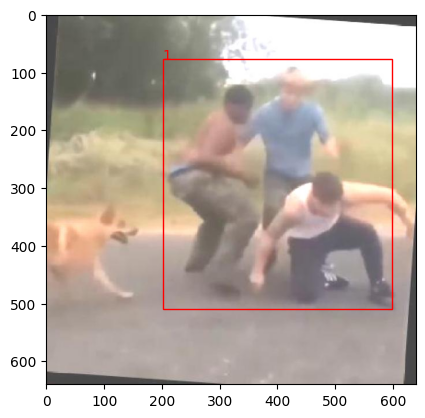

Annotations plotted for /content/dataset/train/images/V_21_F144_jpg.rf.724bc55a9f0d787bef70e0adfdb79ae5.jpg


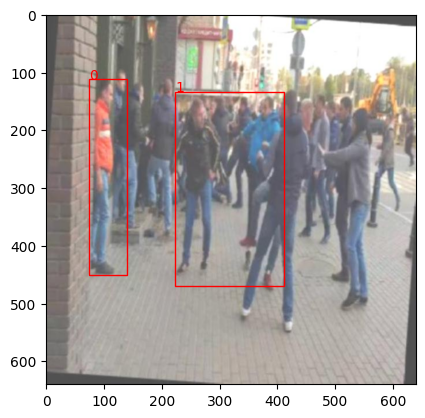

Annotations plotted for /content/dataset/train/images/V_398_F1467_jpg.rf.23dd2882e828dc207dd5412111e06e4d.jpg


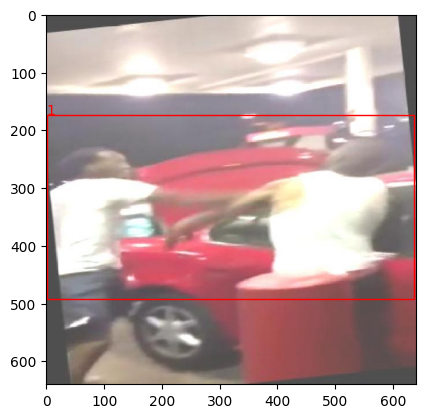

Annotations plotted for /content/dataset/train/images/V_203_F21_jpg.rf.11c153f7ceb749f2045e36161afd5a97.jpg


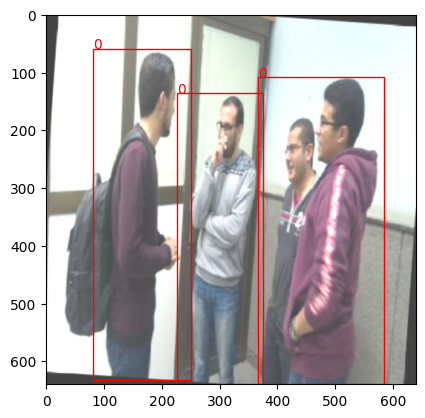

Annotations plotted for /content/dataset/train/images/NV_363_F20_jpg.rf.ece09f37952ec1e00300fb3865b66bfe.jpg


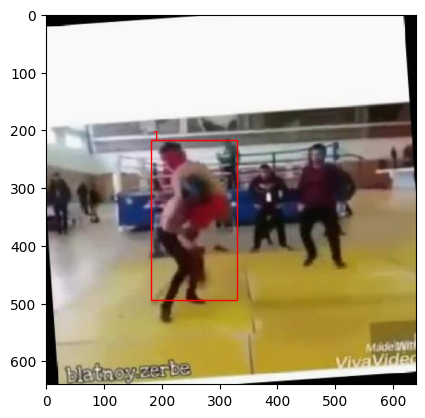

Annotations plotted for /content/dataset/train/images/V_405_F15_jpg.rf.18ad2c3299995d0abf603377b821fa9e.jpg


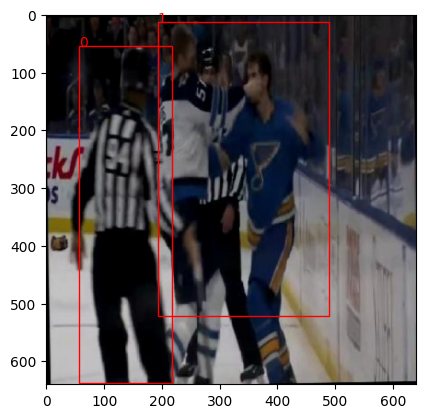

Annotations plotted for /content/dataset/train/images/V_323_F33_jpg.rf.3fd5f7fc61ffd7b2eb40ca8e9a75bbae.jpg


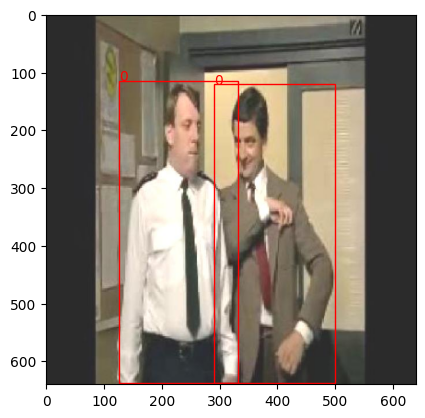

Annotations plotted for /content/dataset/train/images/NV_446_F48_jpg.rf.6ffa0a417cffb9c254db30133869328a.jpg


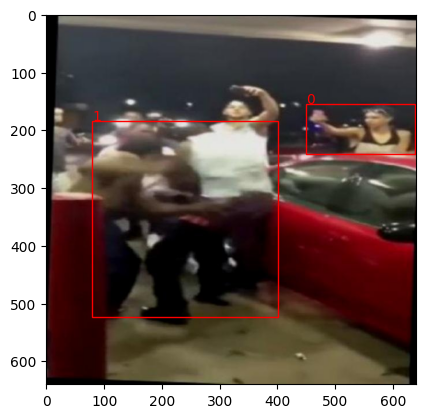

Annotations plotted for /content/dataset/train/images/V_229_F6_jpg.rf.21947013b376a68b3b9f9da84b856c53.jpg


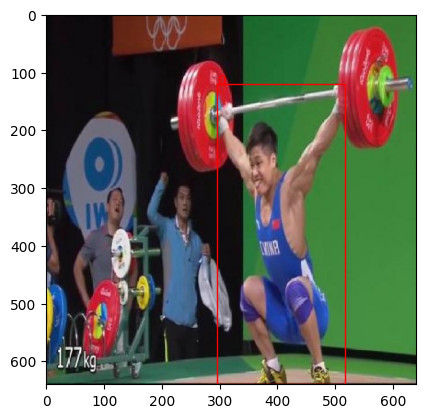

Annotations plotted for /content/dataset/train/images/NV_309_F84_jpg.rf.a027957e48b7e0509f83066dd70944ab.jpg


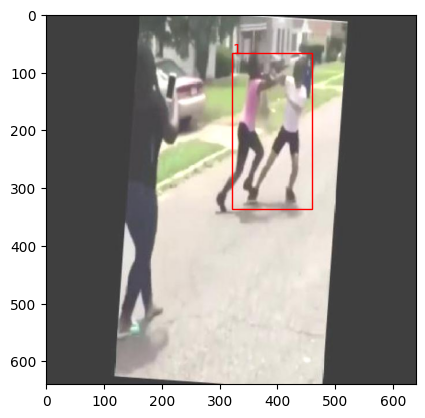

Annotations plotted for /content/dataset/train/images/V_430_F51_jpg.rf.df891e9c5eacad2aea27d984c2ce004d.jpg


In [ ]:
# Display and plot annotations for the first 10 images
for i in range(min(10, len(image_paths))):
    sample_image_path = image_paths[i]
    sample_annotations = load_annotations(annotation_paths[i])
    display_sample(sample_image_path, sample_annotations)
    print(f"Annotations plotted for {sample_image_path}")

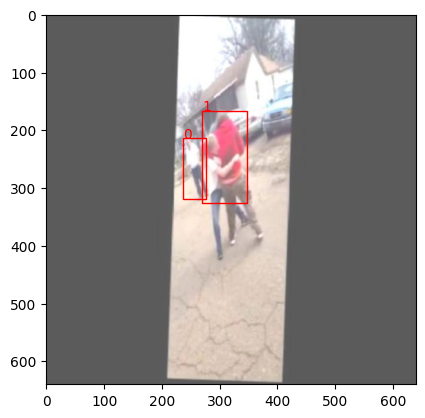

Annotations plotted for /content/dataset/valid/images/V_120_F99_jpg.rf.af9b7dd2623161c5f945aca1a16b967f.jpg


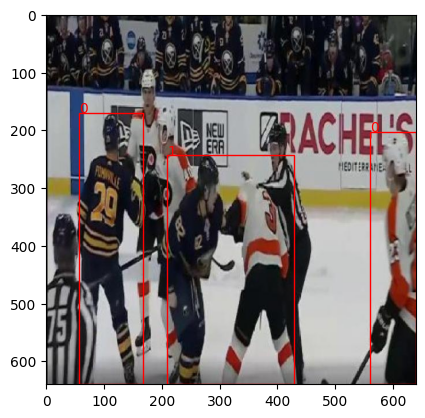

Annotations plotted for /content/dataset/valid/images/V_321_F54_jpg.rf.3321774006c5267fe0e61aa7f8410c56.jpg


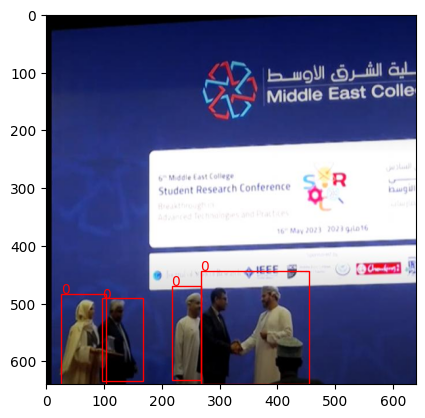

Annotations plotted for /content/dataset/valid/images/Screenshot-2023-06-04-183930_png.rf.5e8bec741b3d0006b809ff0cba691f52.jpg


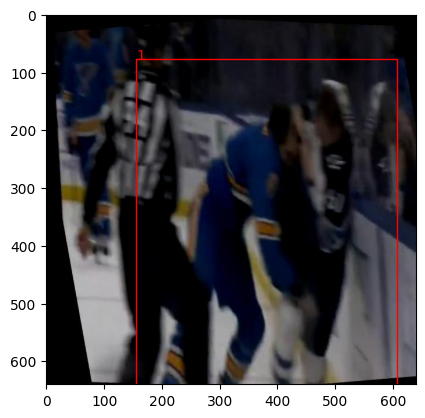

Annotations plotted for /content/dataset/valid/images/V_323_F105_jpg.rf.9bb636a9cc9acbcf369bd6f4c6e3d8fa.jpg


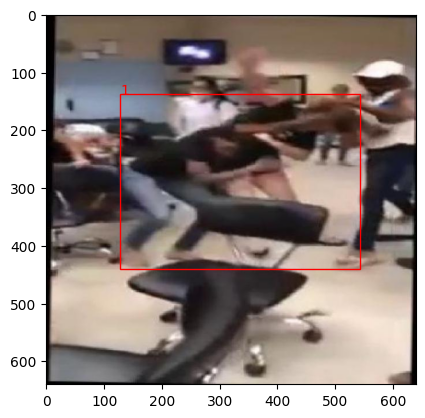

Annotations plotted for /content/dataset/valid/images/V_523_F42_jpg.rf.a2e27e7af74a70c1d7fa72242f32e1fb.jpg


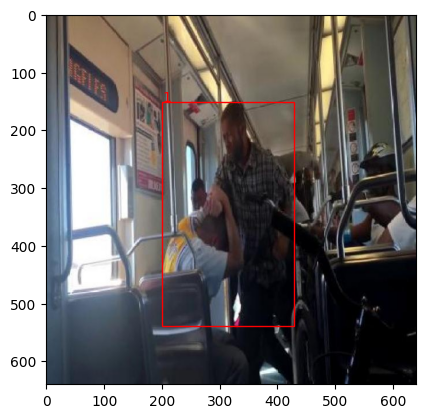

Annotations plotted for /content/dataset/valid/images/V_642_F138_jpg.rf.0b85b853244aa4337444f6a546305f44.jpg


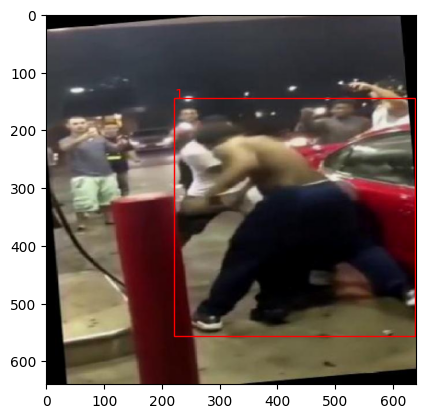

Annotations plotted for /content/dataset/valid/images/V_229_F111_jpg.rf.62334edfb047d9313efa439dcc3d5f64.jpg


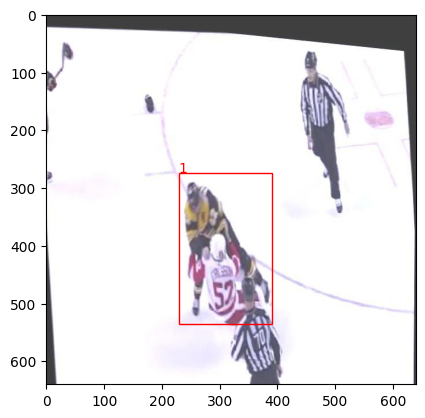

Annotations plotted for /content/dataset/valid/images/V_292_F90_jpg.rf.1a357a2b940b02477bd6ae1c8fe4fef4.jpg


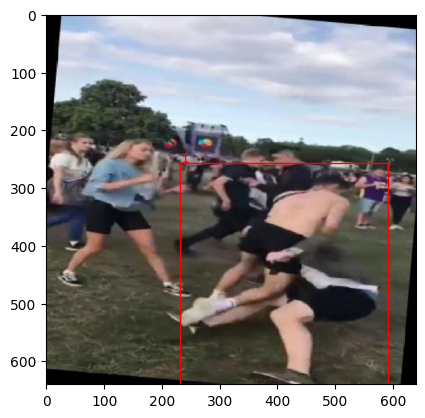

Annotations plotted for /content/dataset/valid/images/V_629_F24_jpg.rf.2cf360b62980a3358cf7a7e4d5c74237.jpg


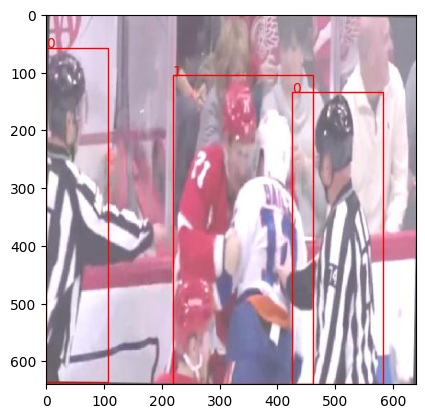

Annotations plotted for /content/dataset/valid/images/V_314_F141_jpg.rf.94d5f2736e6d114295913c3f7c35e028.jpg


In [ ]:
image_paths, annotation_paths = load_sample_data(valid_directory)

# Display and plot annotations for the first 10 images
for i in range(min(10, len(image_paths))):
    sample_image_path = image_paths[i]
    sample_annotations = load_annotations(annotation_paths[i])
    display_sample(sample_image_path, sample_annotations)
    print(f"Annotations plotted for {sample_image_path}")

In [ ]:
  #importing libs
  import ultralytics
  ultralytics.checks()

Ultralytics YOLOv8.1.29 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.4/78.2 GB disk)


In [ ]:
# Install necessary packages
!pip install tensorboard

# Load TensorBoard extension
%load_ext tensorboard

In [ ]:
#importing YOLO
from ultralytics import YOLO
from IPython.display import display, Image

In [ ]:
!yolo task=detect mode=train epochs=5 data=C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/data.yaml model=yolov8n.pt imgsz=720

Ultralytics YOLOv8.1.29 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/dataset/data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=720, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_b

In [ ]:
import pandas as pd

# Path to your CSV file
csv_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/results.csv"

# Load the CSV file into a DataFrame
df = pd.read_csv(csv_path)

# Display the DataFrame
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.4711,2.0018,1.7313,0.43412,0.46338,0.42256,0.18958,1.8792,1.8599,2.3191,0.000555,0.000555,0.000555
1,2,1.4686,1.6056,1.7163,0.53317,0.62393,0.58287,0.29709,1.5769,1.4272,2.0069,0.000891,0.000891,0.000891
2,3,1.4040,1.4627,1.6549,0.59963,0.64283,0.63661,0.34894,1.5175,1.3148,1.9368,0.001007,0.001007,0.001007
3,4,1.3109,1.3112,1.5870,0.68091,0.68442,0.73887,0.43053,1.3416,1.1465,1.7575,0.000677,0.000677,0.000677
4,5,1.2652,1.2241,1.5473,0.67087,0.73338,0.74295,0.46177,1.2661,1.0331,1.6894,0.000677,0.000677,0.000677


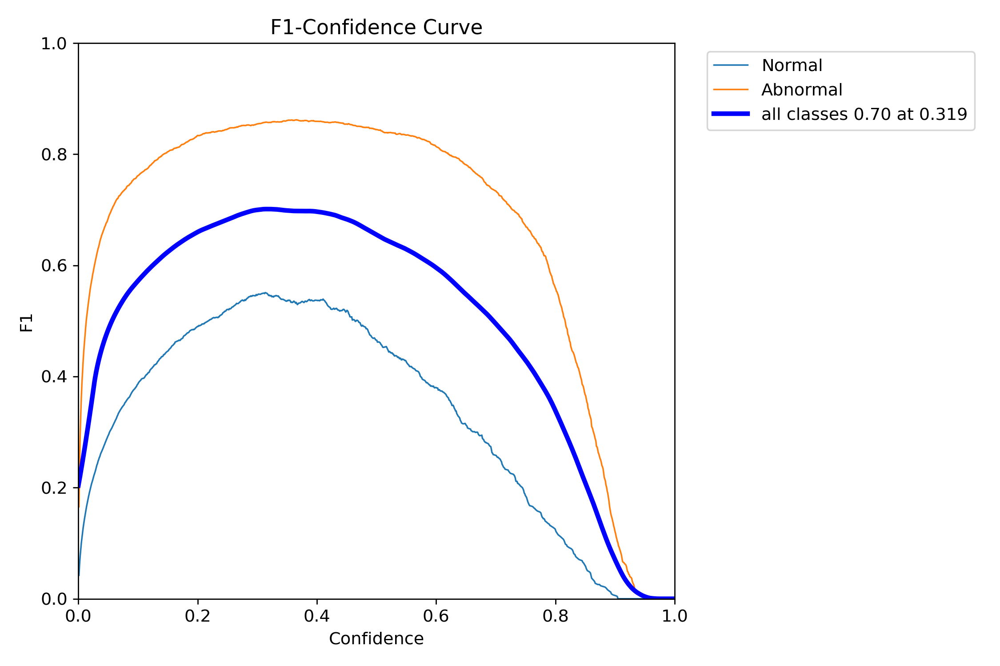

In [ ]:
from IPython.display import Image

# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/F1_curve.png"

# Display the image
Image(filename=image_path)

In [ ]:
!ls C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train

args.yaml					    PR_curve.png	   val_batch0_pred.jpg
confusion_matrix_normalized.png			    R_curve.png		   val_batch1_labels.jpg
confusion_matrix.png				    results.csv		   val_batch1_pred.jpg
events.out.tfevents.1710572253.37120662c2c4.5963.0  results.png		   val_batch2_labels.jpg
F1_curve.png					    train_batch0.jpg	   val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch1.jpg	   weights
labels.jpg					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


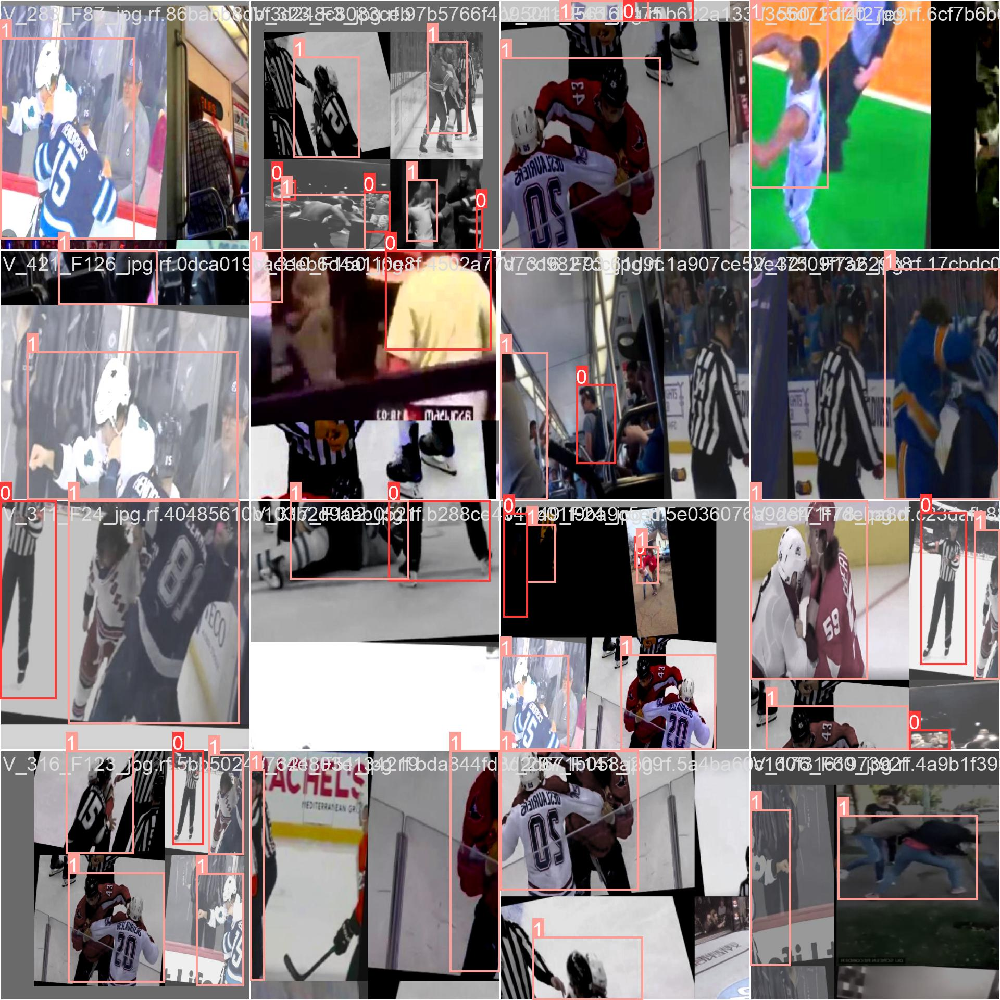

In [ ]:
# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/train_batch2.jpg"

# Display the image
Image(filename=image_path)

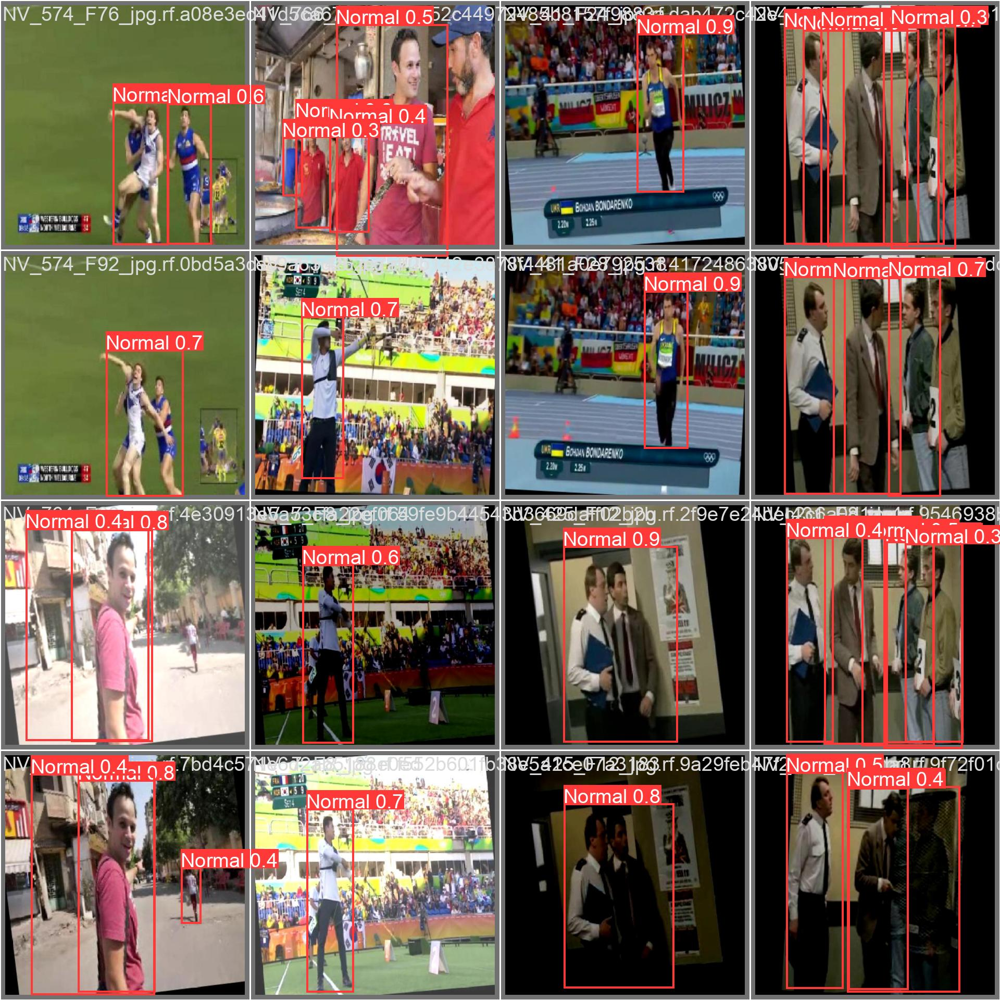

In [ ]:
# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/val_batch2_pred.jpg"

# Display the image
Image(filename=image_path)

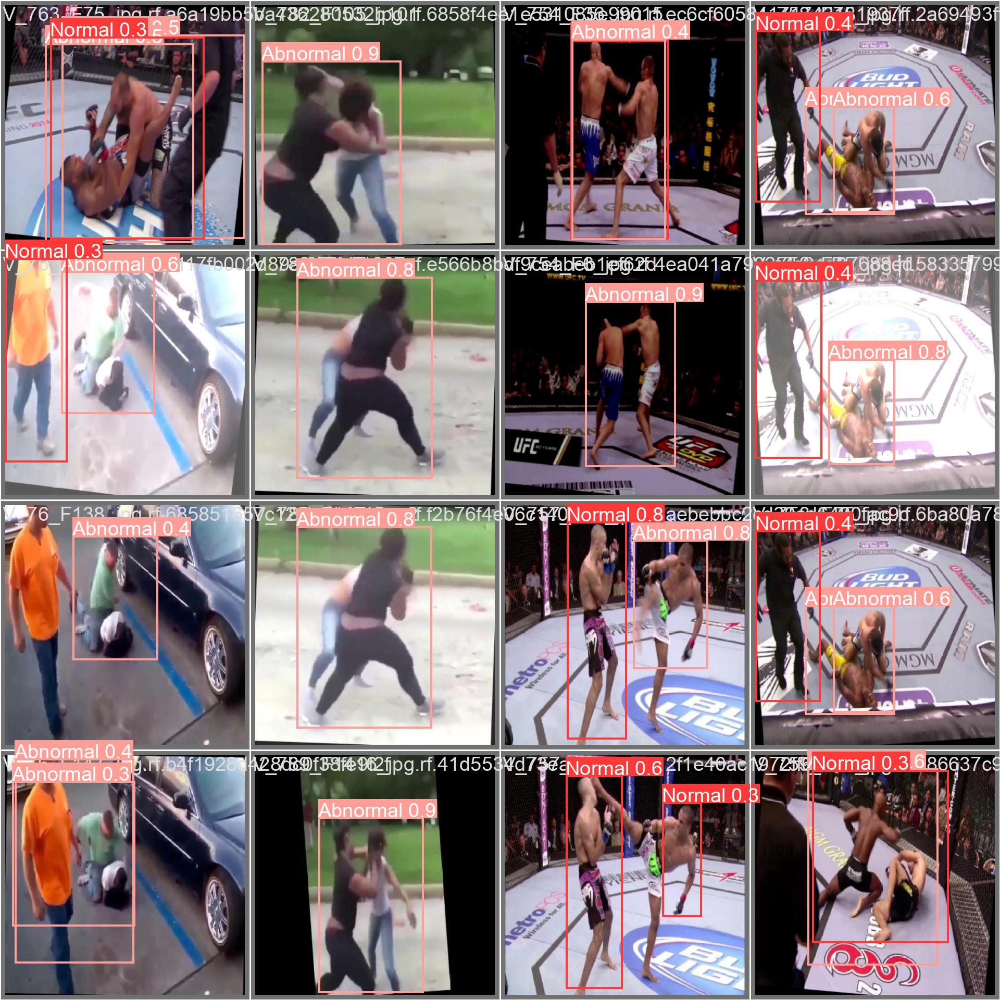

In [ ]:
# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/val_batch0_pred.jpg"

# Display the image
Image(filename=image_path)

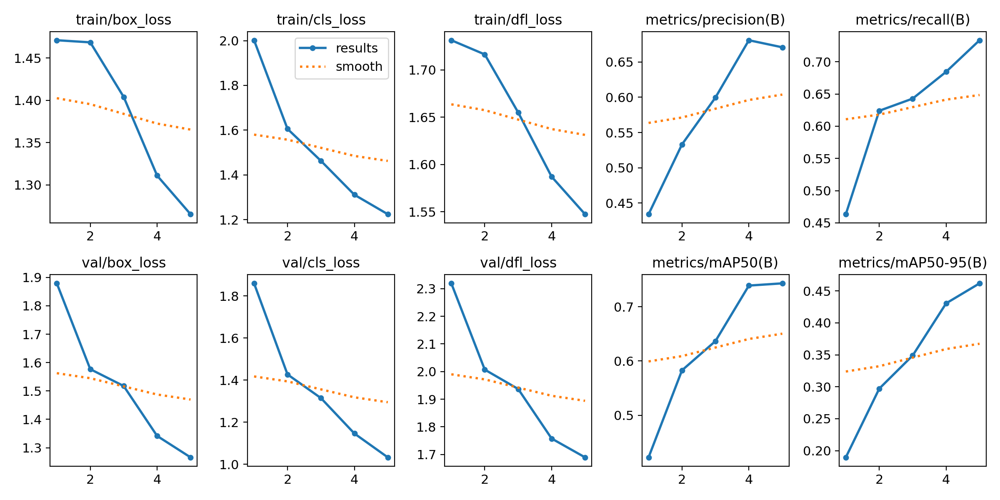

In [ ]:
# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/results.png"

# Display the image
Image(filename=image_path)

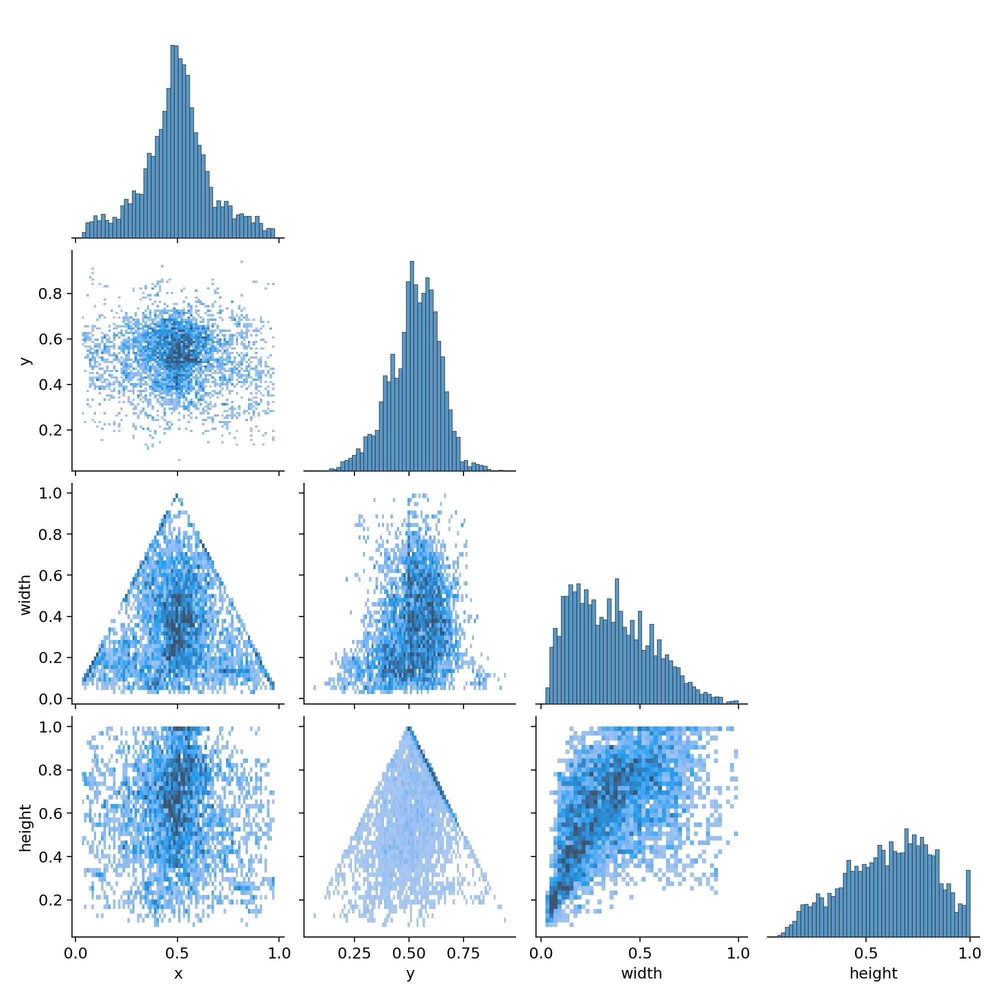

In [ ]:
# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/labels_correlogram.jpg"

# Display the image
Image(filename=image_path)

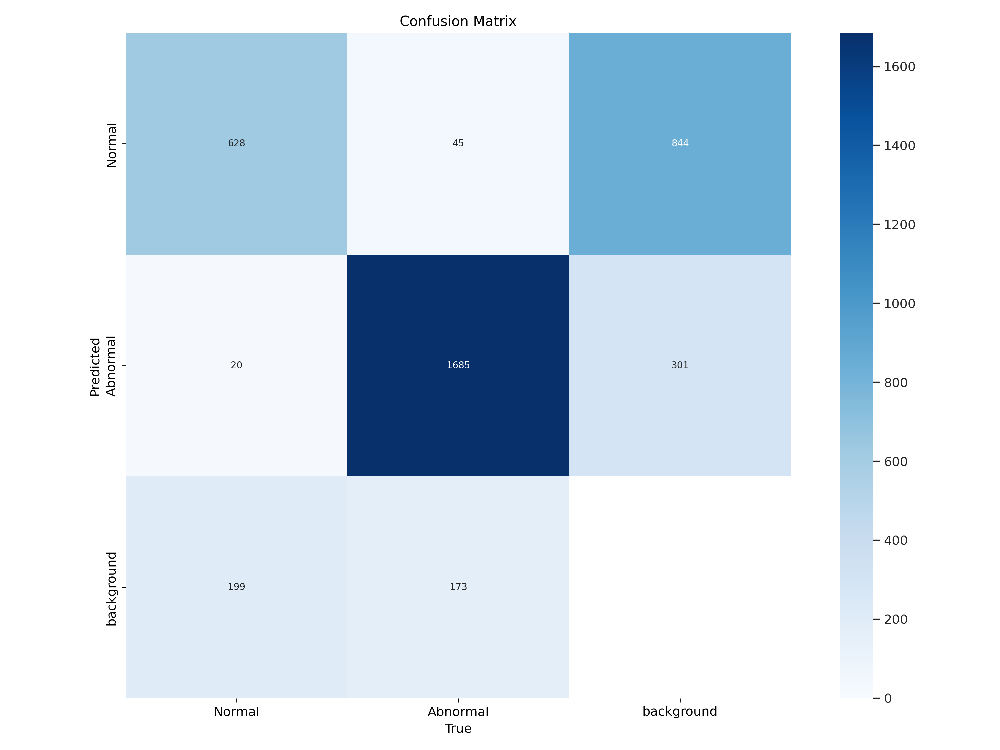

In [ ]:
# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/confusion_matrix.png"

# Display the image
Image(filename=image_path)

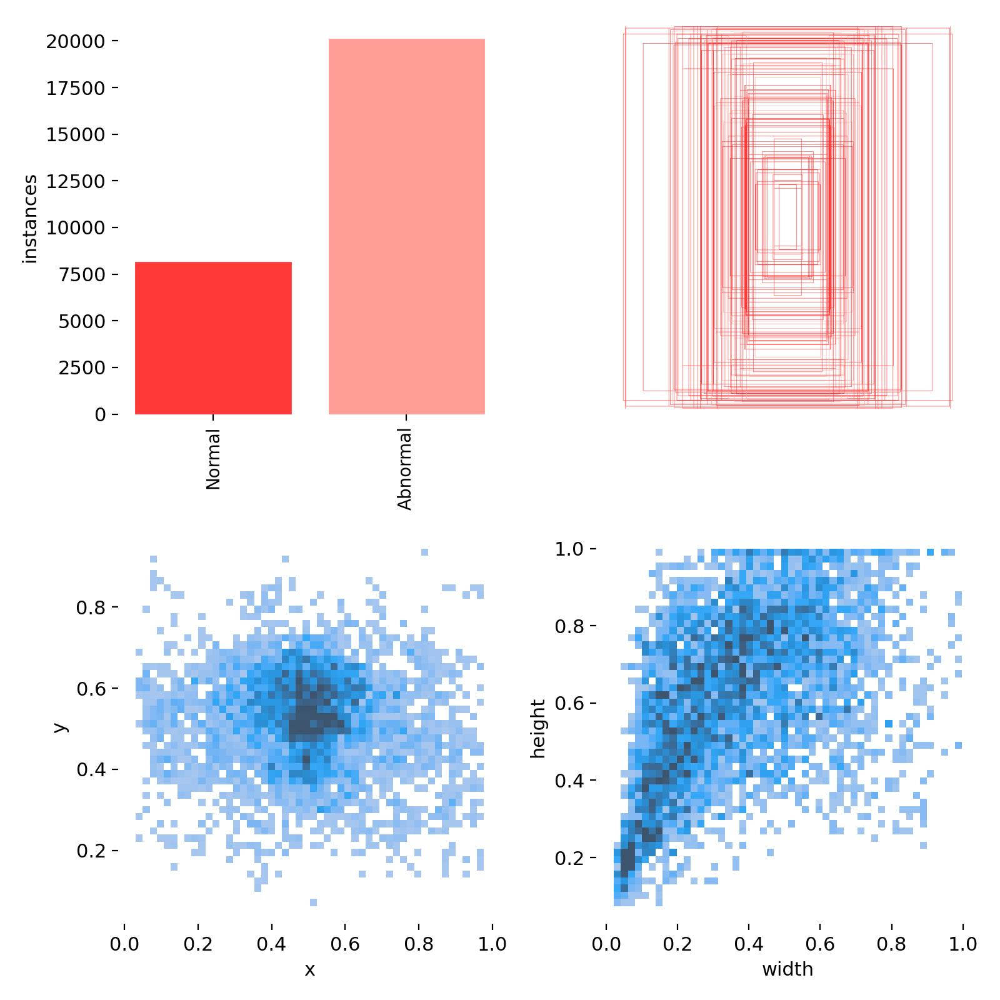

In [ ]:
# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/labels.jpg"

# Display the image
Image(filename=image_path)

In [ ]:
# Start TensorBoard
%tensorboard --logdir C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train

<IPython.core.display.Javascript object>

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/dataset/data.yaml

Ultralytics YOLOv8.1.29 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/dataset/valid/labels.cache... 1979 images, 0 backgrounds, 0 corrupt: 100% 1979/1979 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 124/124 [00:30<00:00,  4.11it/s]
                   all       1979       2750      0.669       0.74      0.743      0.462
                Normal       1979        847       0.48      0.621      0.564      0.327
              Abnormal       1979       1903      0.858      0.859      0.922      0.597
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [5]:
!yolo task=detect mode=predict model=C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/weights/best.pt show=True source=D:/hug1.jpg

Ultralytics YOLOv8.1.41 ðŸš€ Python-3.10.14 torch-2.2.2+cpu CPU (Intel Core(TM) i5-10300H 2.50GHz)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 D:\hug1.jpg: 736x512 1 Normal, 140.6ms
Speed: 0.0ms preprocess, 140.6ms inference, 0.0ms postprocess per image at shape (1, 3, 736, 512)
Results saved to runs\detect\predict6
ðŸ’¡ Learn more at https://docs.ultralytics.com/modes/predict


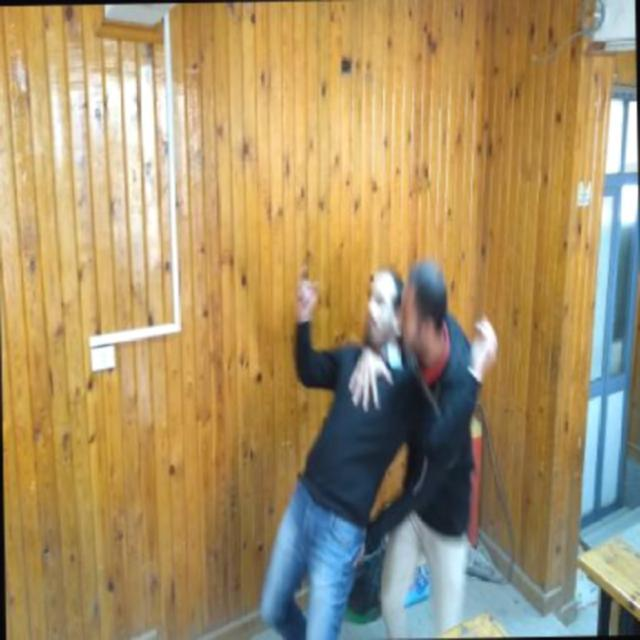

In [2]:
from IPython.display import Image

# Path to your image
image_path = "C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Dataset/dataset/test/images/V_1_F66_jpg.rf.26a3028bee40ee1e21bfdd550fa34f0d.jpg"

# Display the image
Image(filename=image_path)

# predict

In [1]:
!yolo task=detect mode=predict model=C:/Users/pradh/OneDrive/Desktop/Abnormal_Behaviour_/Abnormal_Behaviour/Model/run_model/detect/train/weights/best.pt show=True source=D:\stand.jpg

Ultralytics YOLOv8.1.41 ðŸš€ Python-3.10.14 torch-2.2.2+cpu CPU (Intel Core(TM) i5-10300H 2.50GHz)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 D:\stand.jpg: 736x384 2 Normals, 149.0ms
Speed: 15.6ms preprocess, 149.0ms inference, 15.6ms postprocess per image at shape (1, 3, 736, 384)
Results saved to runs\detect\predict7
ðŸ’¡ Learn more at https://docs.ultralytics.com/modes/predict
